In [9]:
from data_loaders import Hip_Dataset,Hip_Dataset_Specific_Path
from PIL import Image
import train as Train
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from datetime import datetime
import pandas as pd
from Models import *
import matplotlib.pyplot as plt
from importlib import reload
import data_loaders
import numpy as np

In [10]:
reload(data_loaders)
Hip_Dataset=data_loaders.Hip_Dataset
Hip_Dataset_Specific_Path=data_loaders.Hip_Dataset_Specific_Path

In [11]:
reload(Train)
train_setup=Train.training_setup

In [12]:
image_size=(240,240)

In [5]:
ann_path1 = 'Batch02/via_project_28Mar2021_16h4m_csv.csv'
ann_path="datasets/via_project_19Mar2021_23h45m_csv.csv"
ann_path2="Combined/list_final.csv"
ann_path3="Batch_06/batch_06.csv"
ann_path4="Batch_07/batch_07.csv"
ann_path5="Batch_08/batch_08.csv"

ld_train= Hip_Dataset(ann_path1,"Batch02",image_size,9)
ld_test= Hip_Dataset(ann_path,"datasets",image_size,9)
ld_total= Hip_Dataset(ann_path2,"Combined",image_size,9)
ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,9)
ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,9)
ld_08= Hip_Dataset(ann_path4,"Batch_08",image_size,9)

test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
train_loader=DataLoader(ld_train, batch_size = 2, shuffle = True)
total_loader=DataLoader(ld_total, batch_size = 2, shuffle = True)

In [6]:
ld_train_combined=[ld_total,ld_06,ld_07,ld_08]

In [6]:
total_loader.data

AttributeError: 'DataLoader' object has no attribute 'data'

## Make Findout the path and Grid index of all the Fracture image

In [5]:
def get_fracture_df(ld_combine):
    columns =["Filename", "Grid"]
    Fracture_record= pd.DataFrame(columns=columns)
    for ld in ld_combined:
        for k, (img, label) in enumerate(ld):
            if label==1:
                grid=k%9
                file_name=ld.get_file_name(k)
                Fracture_record=Fracture_record.append({"Filename":file_name,"Grid":grid},ignore_index = True)

    return Fracture_record

In [13]:
Fracture_record=pd.read_csv("Fracture_record.csv")

In [14]:
index_count =Fracture_record["Grid"].value_counts()

In [15]:
# fracture_set=Hip_Dataset_specific("Fracture_record.csv",image_size,argumentation=10)
# len(fracture_set)
def argumented_loader(current_len,Fracture_record,index):
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= current_len//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    return this_set
    


In [16]:
this_record=Fracture_record[Fracture_record["Grid"]==4]
args= len(total_train_loader)//len(this_record["Grid"])
this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
print(list(this_record["Grid"])[92])
len(this_set)
numpy=this_set[2417][0].numpy()
numpy=np.sum(numpy, axis=0)/3
numpy.shape
plt.imshow(numpy)

IndexError: list index out of range

## Train for grid on 3,4,5,7

In [17]:
epochs= 10
grid_indexes= [3,4,5,7]
weights=np.zeros(2)
weights=torch.FloatTensor(weights)
weights[0]=0.5
weights[1]=0.5
ann_path1 = 'Batch02/via_project_28Mar2021_16h4m_csv.csv'
ann_path="datasets/via_project_19Mar2021_23h45m_csv.csv"
ann_path2="Combined/list_final.csv"
ann_path3="Batch_06/batch_06.csv"
ann_path4="Batch_07/batch_07.csv"
ann_path5="Batch_08/batch_08.csv"


In [18]:
for index in grid_indexes:
    ## The original images 
    print("Grid :", index)
    this_record=None
    ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
    ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
    ld_test=ld_test+ld_test2
    ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
    ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
    ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
    ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
    total_train_loader= ld_06+ld_07+ld_08+ld_total
    total_train_loader[1000]
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= len(total_train_loader)//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    total_train_loader=total_train_loader+this_set
    print(len(total_train_loader))
    test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
    train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

    model,val_accuracy,val_loss_list= Train.training_setup("googlenet",train_loader,ld_test, image_size[1],epochs,weights,index=index)

Grid : 3
2458


RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 8.00 GiB total capacity; 516.47 MiB already allocated; 11.79 MiB free; 522.00 MiB reserved in total by PyTorch)

Grid : 3
2624
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 1/10 -   01/05/2021 02:08:28  Training Loss: 2.770 -  Validation Loss: 0.578 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 2/10 -   01/05/2021 02:13:10  Training Loss: 2.501 -  Validation Loss: 0.567 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 3/10 -   01/05/2021 02:17:51  Training Loss: 2.150 -  Validation Loss: 0.566 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 4/10 -   01/05/2021 02:22:36  Training Loss: 2.301 -  Validation Loss: 0.923 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 5/10 -   01/05/2021 02:27:21  Training Loss: 2.536 -  Validation Loss: 0.578 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 6/10 -   01/05/2021 02:32:02  Training Loss: 2.268 -  Validation Loss: 0.566 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0

/home/jovyan/AI_healthcare/Project/utilis.py:51: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


-- End of training --
Grid : 4
2603
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 1/10 -   01/05/2021 02:56:28  Training Loss: 2.163 -  Validation Loss: 0.414 -  Validation Accuracy: 0.001
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 2/10 -   01/05/2021 03:01:57  Training Loss: 2.010 -  Validation Loss: 0.414 -  Validation Accuracy: 0.001
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 3/10 -   01/05/2021 03:07:20  Training Loss: 2.147 -  Validation Loss: 0.427 -  Validation Accuracy: 0.001
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 4/10 -   01/05/2021 03:12:49  Training Loss: 2.069 -  Validation Loss: 0.414 -  Validation Accuracy: 0.001
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 5/10 -   01/05/2021 03:18:18  Training Loss: 2.043 -  Validation Loss: 0.414 -  Validation Accuracy: 0.001
[[ 0  0]
 [84  9]]


KeyboardInterrupt: 

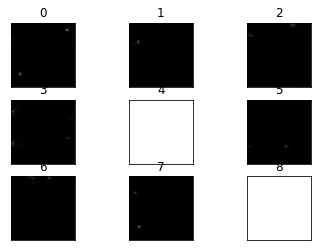

In [11]:
weights[0]=0.5
weights[1]=1.5
for index in grid_indexes:
    ## The original images 
    print("Grid :", index)
    this_record=None
    ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
    ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
    ld_test=ld_test+ld_test2
    ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
    ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
    ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
    ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
    total_train_loader= ld_06+ld_07+ld_08+ld_total+ld_test2
    total_train_loader[1000]
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= len(total_train_loader)//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    total_train_loader=total_train_loader+this_set
    print(len(total_train_loader))
    test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
    train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

    model,val_accuracy,val_loss_list= Train.training_setup("googlenet",train_loader,ld_test, image_size[1],epochs,weights,index=index)

Grid : 3
2458


/home/jovyan/AI_healthcare/Project/utilis.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 1/10 -   30/04/2021 11:15:21  Training Loss: 7.054 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 2/10 -   30/04/2021 11:19:45  Training Loss: 7.498 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 3/10 -   30/04/2021 11:24:09  Training Loss: 7.498 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 4/10 -   30/04/2021 11:28:31  Training Loss: 7.498 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 5/10 -   30/04/2021 11:32:55  Training Loss: 7.498 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 6/10 -   30/04/2021 11:37:18  Training Loss: 7.498 -  Validation Loss: 0.601 -  Validation Accuracy: 0.004
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]

/home/jovyan/AI_healthcare/Project/utilis.py:51: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


-- End of training --
Grid : 4
2469
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 1/10 -   30/04/2021 12:00:03  Training Loss: 1.681 -  Validation Loss: 0.391 -  Validation Accuracy: 0.010
[[84  9]
 [ 0  0]]
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 2/10 -   30/04/2021 12:05:07  Training Loss: 1.860 -  Validation Loss: 0.413 -  Validation Accuracy: 0.010
[[84  9]
 [ 0  0]]
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 3/10 -   30/04/2021 12:10:15  Training Loss: 1.536 -  Validation Loss: 0.351 -  Validation Accuracy: 0.010
[[84  9]
 [ 0  0]]
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 4/10 -   30/04/2021 12:15:20  Training Loss: 1.471 -  Validation Loss: 0.345 -  Validation Accuracy: 0.010
[[84  9]
 [ 0  0]]
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 5/10 -   30/04/2021 12:20:29  Training Loss: 1.453 -  Validation Loss: 0.345 -  Validation Accuracy: 0.010
[[84  9]
 [ 0  0]]
TPR : 0.0
[[84  9]
 [ 0  0]]
Epoch: 6/10 -   30/04/2021 12:25:35  Training Loss: 1.479 -  Validation Loss: 0.347 -  Validation Accuracy: 0.010
[[84  9]
 [

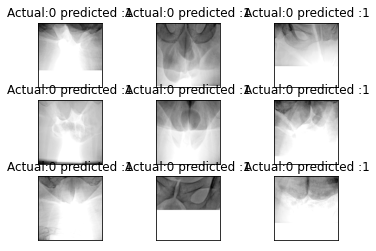

In [11]:
weights[0]=0.5
weights[1]=1.6
for index in grid_indexes:
    ## The original images 
    print("Grid :", index)
    this_record=None
    ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
    ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
    ld_test=ld_test+ld_test2
    ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
    ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
    ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
    ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
    total_train_loader= ld_06+ld_07+ld_08+ld_total
    total_train_loader[1000]
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= len(total_train_loader)//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    total_train_loader=total_train_loader+this_set
    print(len(total_train_loader))
    test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
    train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

    model,val_accuracy,val_loss_list= Train.training_setup("googlenet",train_loader,ld_test, image_size[1],epochs,weights,index=index)

In [12]:
def validation(model, testloader, criterion, device):
    test_loss = 0
    accuracy = 0
    TPR=[]
    equality=[]
    with torch.no_grad():
        for args in testloader:
            images, labels = args[0], args[1]
            images, labels = images.to(device), labels.to(device)

            output = model.forward(images)
            test_loss += criterion(output, labels).item()

            ps = torch.argmax(output,dim=1)
            correct = int(int(labels.data[0]) == int(ps[0]))
            equality.append(correct)
            if int(args[1][0])==1 and int(torch.argmax(output)) ==1:
                TPR.append(1)
            elif int(args[1]) == 1 and int(torch.argmax(output)) == 0:
                TPR.append(0)
    accuracy= sum(equality)/len(equality)
    print("TPR : {}".format(sum(TPR)/len(TPR)))
    return test_loss, accuracy
criterion = torch.nn.NLLLoss(weights,reduction="sum")
model= Googlnet_modified()
validation(model, test_loader, criterion, "cpu")

TPR : 1.0


(37.04235377907753, 0.3118279569892473)

In [ ]:
for index in grid_indexes:
    ## The original images 
    print("Grid :", index)
    this_record=None
    ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
    ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
    ld_test=ld_test+ld_test2
    ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
    ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
    ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
    ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
    total_train_loader= ld_06+ld_07+ld_08+ld_total
    total_train_loader[1000]
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= len(total_train_loader)//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    total_train_loader=total_train_loader+this_set
    print(len(total_train_loader))
    test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
    train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

    Train.training_setup("googlenet",train_loader,ld_test, image_size[1],epochs,weights,index=index)

Grid : 3
2458


/home/jovyan/AI_healthcare/Project/utilis.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 1/5 -   30/04/2021 02:50:49  Training Loss: 367.223 -  Validation Loss: 23.336 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 2/5 -   30/04/2021 02:55:22  Training Loss: 368.489 -  Validation Loss: 23.336 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 3/5 -   30/04/2021 02:59:54  Training Loss: 368.489 -  Validation Loss: 23.336 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 4/5 -   30/04/2021 03:04:22  Training Loss: 368.489 -  Validation Loss: 23.336 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 5/5 -   30/04/2021 03:08:52  Training Loss: 368.489 -  Validation Loss: 23.336 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]


/home/jovyan/AI_healthcare/Project/utilis.py:50: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TypeError: img should be PIL Image. Got <class 'torch.Tensor'>

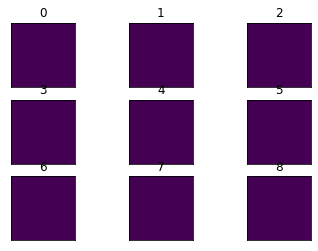

In [9]:
#weight= 0.5,0.5
for index in grid_indexes:
    ## The original images 
    print("Grid :", index)
    this_record=None
    ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
    ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
    ld_test=ld_test+ld_test2
    ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
    ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
    ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
    ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
    total_train_loader= ld_06+ld_07+ld_08+ld_total
    total_train_loader[1000]
    this_record=Fracture_record[Fracture_record["Grid"]==index]
    args= len(total_train_loader)//len(this_record["Grid"])
    this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
    total_train_loader=total_train_loader+this_set
    print(len(total_train_loader))
    test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
    train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

    Train.training_setup("custom_1",train_loader,ld_test, image_size[1],epochs,weights,index=index)


2469


/home/jovyan/AI_healthcare/Project/utilis.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 1/5 -   26/04/2021 14:41:58  Training Loss: 20.493 -  Validation Loss: 0.347 -  Validation Accuracy: 0.903
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 2/5 -   26/04/2021 14:46:59  Training Loss: 3.464 -  Validation Loss: 0.347 -  Validation Accuracy: 0.903
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 3/5 -   26/04/2021 14:52:02  Training Loss: 3.464 -  Validation Loss: 0.347 -  Validation Accuracy: 0.903
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 4/5 -   26/04/2021 14:57:03  Training Loss: 3.464 -  Validation Loss: 0.347 -  Validation Accuracy: 0.903
[[ 0  0]
 [84  9]]
TPR : 1.0
[[ 0  0]
 [84  9]]
Epoch: 5/5 -   26/04/2021 15:02:08  Training Loss: 3.464 -  Validation Loss: 0.347 -  Validation Accuracy: 0.903
[[ 0  0]
 [84  9]]


TypeError: plot_xray9() takes 4 positional arguments but 5 were given

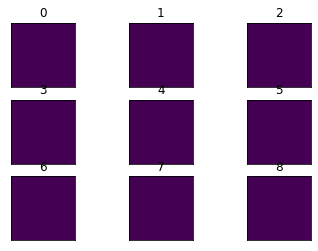

In [11]:
index=4
this_record=None
ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
ld_test=ld_test+ld_test2
ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
total_train_loader= ld_06+ld_07+ld_08+ld_total
total_train_loader[1000]
this_record=Fracture_record[Fracture_record["Grid"]==index]
args= len(total_train_loader)//len(this_record["Grid"])
this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
total_train_loader=total_train_loader+this_set
print(len(total_train_loader))
test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

Train.training_setup("custom_1",train_loader,ld_test, image_size[1],epochs,weights,index=index)

In [11]:
weights[0]=0.5
weights[1]=4

2458


/home/jovyan/AI_healthcare/Project/utilis.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 1/5 -   26/04/2021 15:33:03  Training Loss: 18.520 -  Validation Loss: 1.155 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 2/5 -   26/04/2021 15:37:29  Training Loss: 16.303 -  Validation Loss: 1.155 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 3/5 -   26/04/2021 15:41:58  Training Loss: 16.303 -  Validation Loss: 1.155 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 4/5 -   26/04/2021 15:46:27  Training Loss: 16.303 -  Validation Loss: 1.155 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]
TPR : 1.0
[[ 0  0]
 [62 31]]
Epoch: 5/5 -   26/04/2021 15:50:56  Training Loss: 16.303 -  Validation Loss: 1.155 -  Validation Accuracy: 0.667
[[ 0  0]
 [62 31]]


/home/jovyan/AI_healthcare/Project/utilis.py:50: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3, 3, image_index + 1)


TypeError: img should be PIL Image. Got <class 'torch.Tensor'>

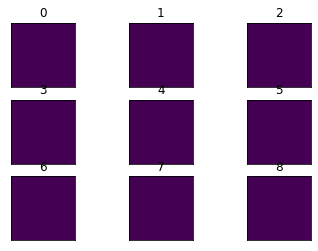

In [12]:
index=3
this_record=None
ld_test= Hip_Dataset(ann_path,"datasets",image_size,index)
ld_test2=Hip_Dataset(ann_path1,"Batch02",image_size,index)
ld_test=ld_test+ld_test2
ld_total= Hip_Dataset(ann_path2,"Combined",image_size,index)
ld_06= Hip_Dataset(ann_path3,"Batch_06",image_size,index)
ld_07= Hip_Dataset(ann_path4,"Batch_07",image_size,index)
ld_08= Hip_Dataset(ann_path5,"Batch_08",image_size,index)
total_train_loader= ld_06+ld_07+ld_08+ld_total
total_train_loader[1000]
this_record=Fracture_record[Fracture_record["Grid"]==index]
args= len(total_train_loader)//len(this_record["Grid"])
this_set =Hip_Dataset_Specific_Path(this_record,image_size,argumentation=args)
total_train_loader=total_train_loader+this_set
print(len(total_train_loader))
test_loader=DataLoader(ld_test, batch_size = 1, shuffle = True)
train_loader=DataLoader(total_train_loader, batch_size = 10, shuffle = True)

Train.training_setup("custom_1",train_loader,ld_test, image_size[1],epochs,weights,index=index)

## Test with single loader 

In [25]:
sum(labels)/len(labels)

0.3333333333333333

In [12]:
Net =Custom_Net1(640)


TypeError: torch.nn.modules.flatten.Flatten is not a Module subclass

In [ ]:
weight2= 

In [10]:
weights[0]=1000
weights[1]=0.5

In [11]:
model = getattr(models, "googlenet")(pretrained=True)
newmodel= torch.nn.Sequential(*(list(model.children())[:-1]))
n_in = next(model.fc.modules()).in_features
model=newmodel
model.classifier = NN_Classifier(input_size=n_in, output_size=2, hidden_layers=[150,100,50])
learning_rate=0.01
optimizer=torch.optim.Adam(model.parameters(), lr=learning_rate)
train_model =train(total_loader,test_loader,model, optimizer,weights,epochs=15)

Epoch: 1/15 -   13/04/2021 19:46:35  Training Loss: 31.960 -  Validation Loss: 1.513 -  Validation Accuracy: 0.944


KeyboardInterrupt: 

In [13]:
train_model.to("cpu")
train_model.eval()

Sequential(
  (0): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (4): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (5): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (bra

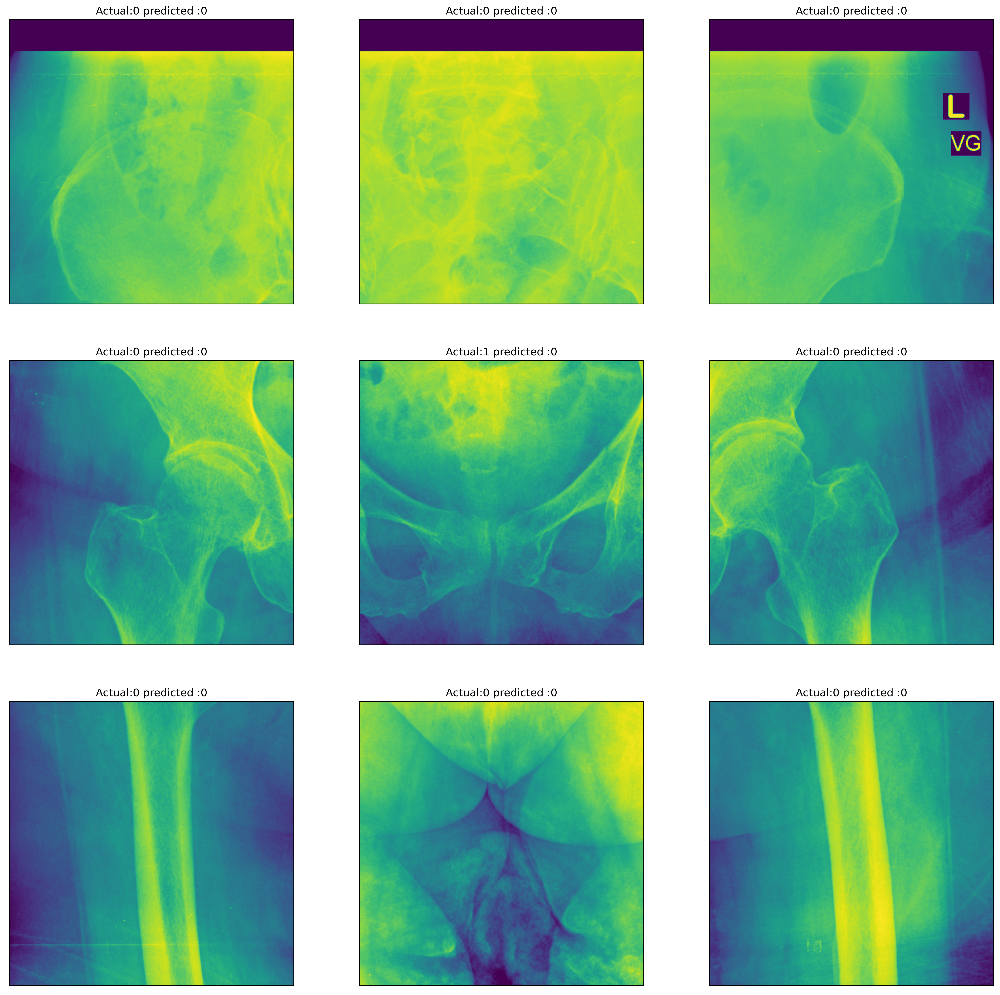

In [22]:
plt.figure(figsize = (20,20),dpi=300)
index=0
label_dict={0:"Normal",1:"Infected_Covid",2:"Infected_non_covid"}
for i in range(3):
    for j in range(3):
        img, label =ld_test[index+144]
        log_prob= train_model(torch.unsqueeze(img, 0))
        plt.subplot(3, 3, index+1)
        pre_process =transforms.Compose( [transforms.Grayscale(num_output_channels=1)])
        img=pre_process(img)
        # Remove x-axis and y-axis ticks from plot
        plt.xticks([], [])
        plt.yticks([], [])
        pred= torch.argmax(log_prob)

        # Labels for each image subplotx`
        plt.title("Actual:{} predicted :{}".format(label,int(pred)))
        
        # Display image
        plt.imshow(img[0,:,:])
        index+=1
        if index >21:
            break
plt.savefig("Pred_example")

In [19]:
pred_array=[]
actual=[]
for img, label  in ld_test:
    log_prob= train_model(torch.unsqueeze(img, 0))
    pred= torch.argmax(log_prob)
    actual.append(label)
    pred_array.append(int(pred))

In [20]:
from sklearn.metrics import confusion_matrix

In [21]:
confusion_matrix(actual, pred_array)

array([[170,   0],
       [ 10,   0]], dtype=int64)

In [23]:
normal=0
fracture=0
for img, label  in ld_test:
    if label==1:
        fracture+=1
    if label==0:
        normal +=1

<BarContainer object of 2 artists>

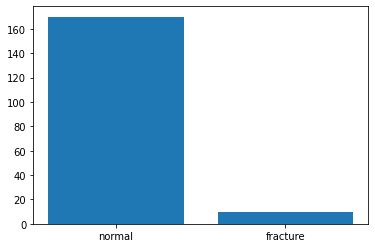

In [24]:
plt.bar(["normal","fracture"],[normal,fracture])

In [15]:
train_model.to("cpu")
train_model.eval()
def plt_map(img, saliency):
    fig, ax = plt.subplots(1, 4)
    ax[0].imshow(img)
    ax[0].axis('off')
    ax[1].imshow(saliency[0,:,:], cmap='hot')
    ax[1].axis('off')
    ax[2].imshow(saliency[1,:,:], cmap='hot')
    ax[2].axis('off')
    ax[3].imshow(saliency[2,:,:], cmap='hot')
    ax[3].axis('off')
    plt.tight_layout()
    fig.suptitle('The Image and Its Saliency Map')
    plt.show() 
for img, label in test_loader:
    img.requires_grad_()
    pred =train_model(img)
    losses= F.nll_loss(pred, label)
    losses.backward()
    print(losses.item())
    datagrad= img.grad.data.numpy()[0,:,:,:]
    mean= np.mean(datagrad)
    std= np.std(datagrad)
    saliency=(datagrad-mean+1)/std
    print(np.sum(saliency))
    saliency2= np.average(((datagrad-mean)+1)/std, axis=0)
    print(saliency2[1,:,:,:])
    img =img.cpu().detach().numpy()[0,:,:,:]
    img=np.average(img, axis=0)
    print(std)
    plt_map(img, saliency)
    break
    


0.19543156027793884
inf


c:\users\zhibo\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in true_divide
c:\users\zhibo\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: divide by zero encountered in true_divide


IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

In [56]:
learning_rate=0.001
optimizer=torch.optim.Adam(model.parameters(), lr=learning_rate)
train_model.to("cuda")
train_model=train(total_loader,test_loader,train_model, optimizer,epochs=10)

Epoch: 1/10 -   05/04/2021 23:05:01  Training Loss: 0.491 -  Validation Loss: 0.927 -  Validation Accuracy: 0.500
Epoch: 2/10 -   05/04/2021 23:05:38  Training Loss: 0.485 -  Validation Loss: 0.927 -  Validation Accuracy: 0.500
Epoch: 3/10 -   05/04/2021 23:06:16  Training Loss: 0.490 -  Validation Loss: 0.929 -  Validation Accuracy: 0.500
Epoch: 4/10 -   05/04/2021 23:06:54  Training Loss: 0.485 -  Validation Loss: 0.931 -  Validation Accuracy: 0.500
Epoch: 5/10 -   05/04/2021 23:07:32  Training Loss: 0.541 -  Validation Loss: 0.932 -  Validation Accuracy: 0.500
Epoch: 6/10 -   05/04/2021 23:08:10  Training Loss: 0.536 -  Validation Loss: 0.929 -  Validation Accuracy: 0.500
Epoch: 7/10 -   05/04/2021 23:08:48  Training Loss: 0.544 -  Validation Loss: 0.925 -  Validation Accuracy: 0.500
Epoch: 8/10 -   05/04/2021 23:09:26  Training Loss: 0.543 -  Validation Loss: 0.920 -  Validation Accuracy: 0.500
Epoch: 9/10 -   05/04/2021 23:10:04  Training Loss: 0.485 -  Validation Loss: 0.915 -  V

ModuleAttributeError: 'Sequential' object has no attribute 'fc'